In [85]:
import torch
import yolo
from PIL import Image
from torchvision import transforms
import torchvision

import numpy as np
from kmeans_pytorch import kmeans


ckpt_path = r"Varmedian\var-s-210.pth"
N = 4
s = 2.0


# COCO dataset, 80 classes
classes = (
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat",
    "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
    "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack",
    "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball",
    "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", "tennis racket",
    "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", "apple",
    "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", "chair",
    "couch", "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse", "remote",
    "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", "book",
    "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush")

model_sizes = {"small": (0.33, 0.5), "medium": (0.67, 0.75), "large": (1, 1), "extreme": (1.33, 1.25)}

model = yolo.YOLOv5(80,model_size=model_sizes['small'], img_sizes=620, score_thresh=0.3, nms_thresh=0.3, N=N, s=s)
model.eval()

checkpoint = torch.load(ckpt_path)
model.load_state_dict(checkpoint['model'])

<All keys matched successfully>

In [86]:
img = Image.open(r'images\000.jpg').convert("RGB")
img = transforms.ToTensor()(img)

model.head.merge = False

images = [img]*N
results, losses = model(images)


In [87]:
def non_max_sup(results, N=4, iou_thres=0.45):
    boxes, labels, scores, sigmas = torch.empty(0), torch.empty(0,dtype=int), torch.empty(0), torch.empty(0)

    if len(results[0]['boxes']) == 1:
        return results[0]

    for i in range(N):
        boxes = torch.cat((boxes,results[i]['boxes']))
        labels = torch.cat((labels,results[i]['labels']))
        scores = torch.cat((scores,results[i]['scores']))
        sigmas = torch.cat((sigmas,results[i]['sigmas']))

    #Buscar una funcion por aparte de nms y modificarla
    nms_ids = torchvision.ops.nms(boxes, scores, iou_thres)


    n_boxes = len(boxes)
    boxes_fin, labels_fin, scores_fin, sigmas_fin = torch.empty((1,4)), torch.empty(0,dtype=int), torch.empty(0), torch.empty(0)
    for i in nms_ids:
        boxes_fin = torch.cat((boxes_fin, boxes[i].expand(1,4)))
        labels_fin = torch.cat((labels_fin, labels[i].expand(1)))
        scores_fin = torch.cat((scores_fin, scores[i].expand(1)))
        sigmas_fin = torch.cat((sigmas_fin, sigmas[i].expand(1,4)))
    boxes_fin = boxes_fin[1:]

    results_nms = {'boxes':boxes_fin, 'labels':labels_fin, 'scores':scores_fin, 'sigmas':sigmas_fin}

    return results_nms


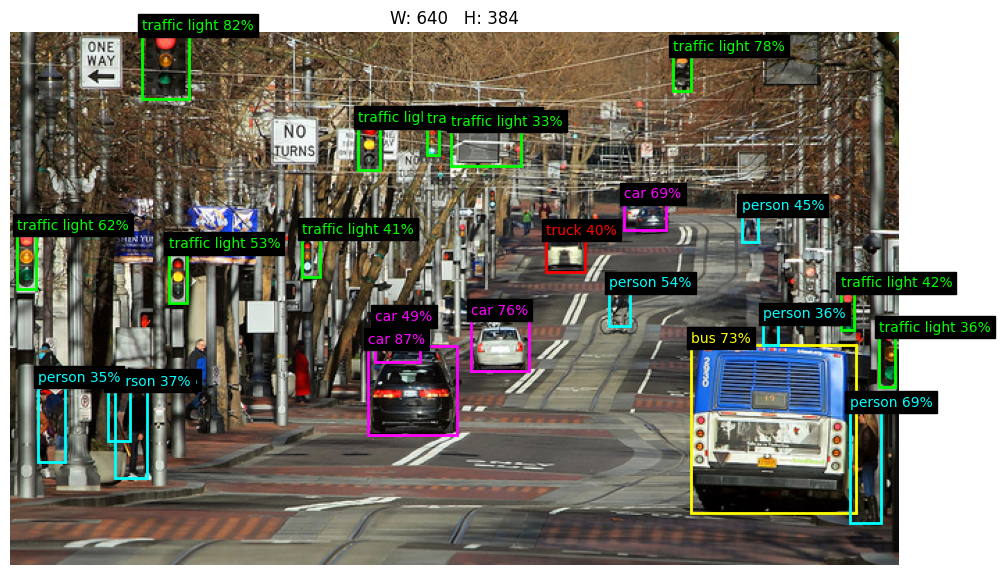

In [92]:
results_1 = non_max_sup(results, N=N)
yolo.show(images[0], [results_1], classes, save="r000.jpg")

torch.Size([3, 333, 500])


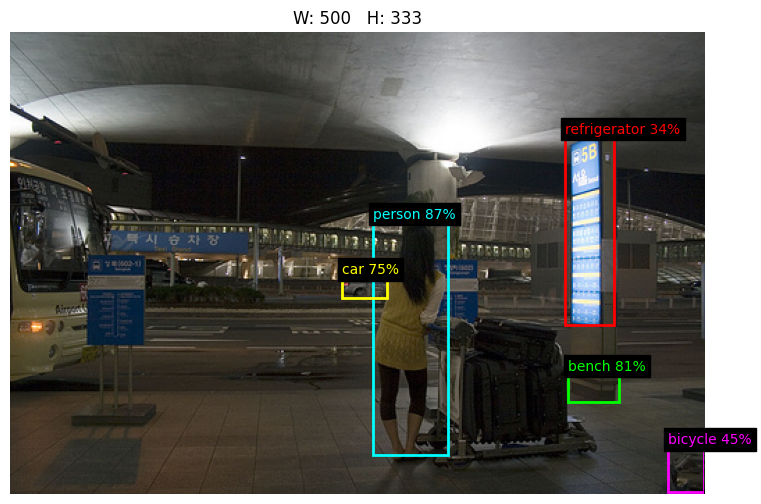

torch.Size([3, 576, 768])


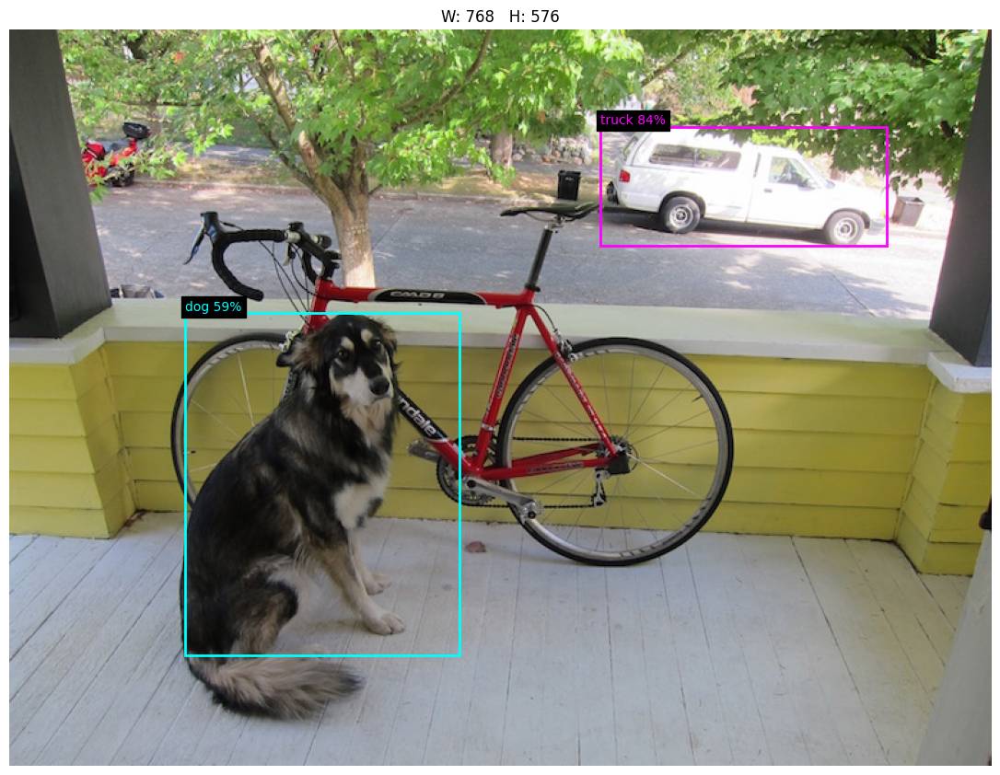

torch.Size([3, 512, 773])


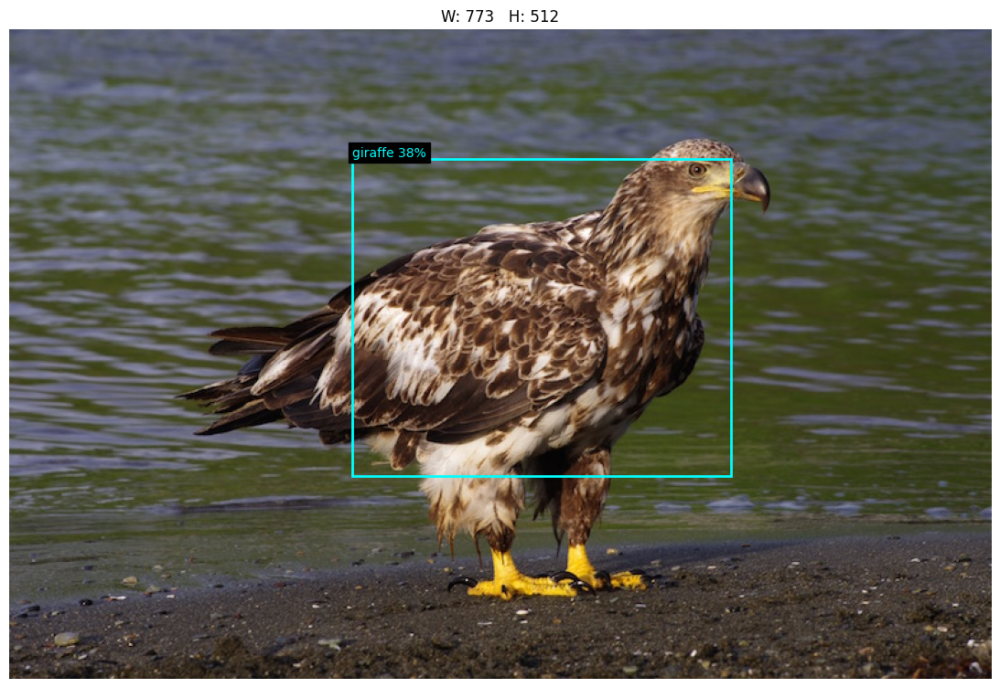

torch.Size([3, 424, 640])


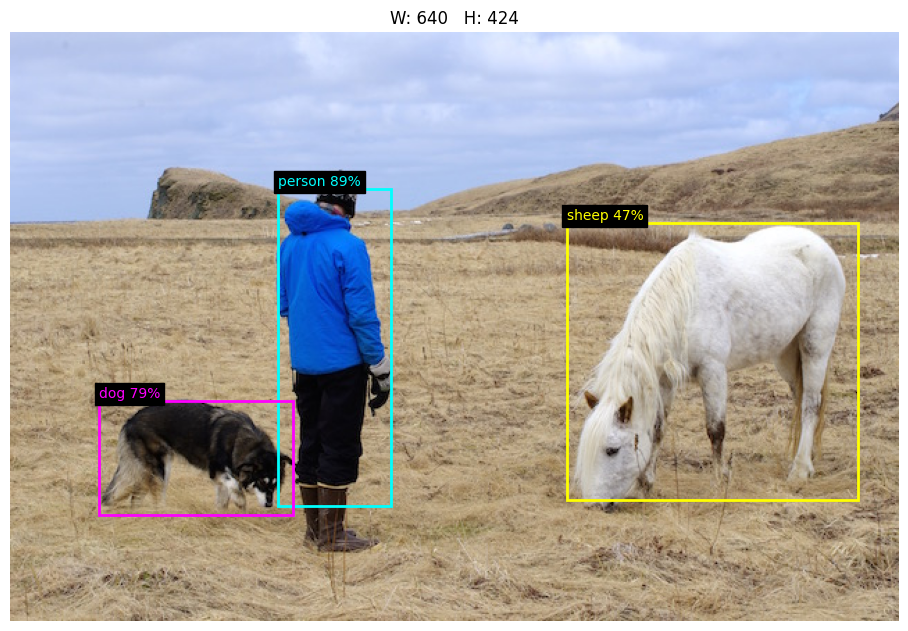

torch.Size([3, 500, 500])


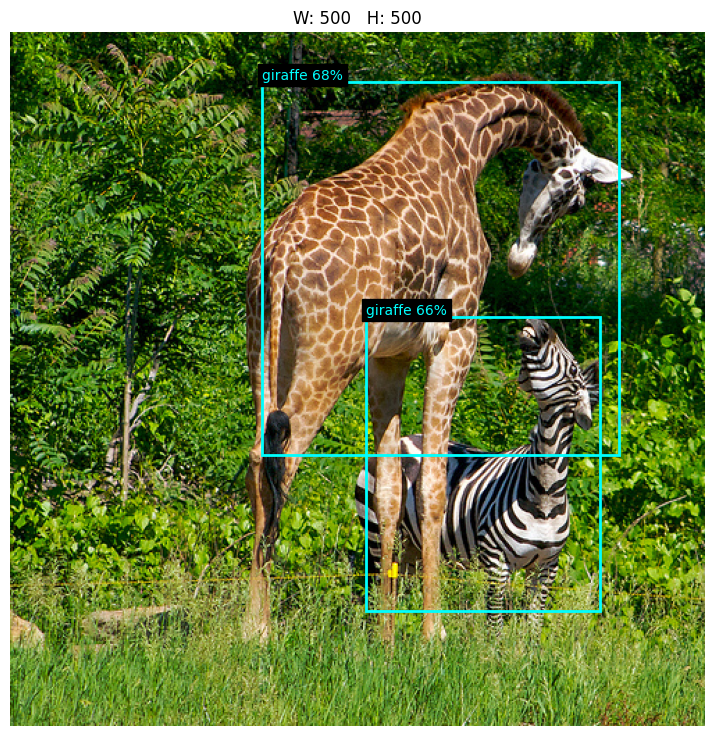

torch.Size([3, 512, 773])


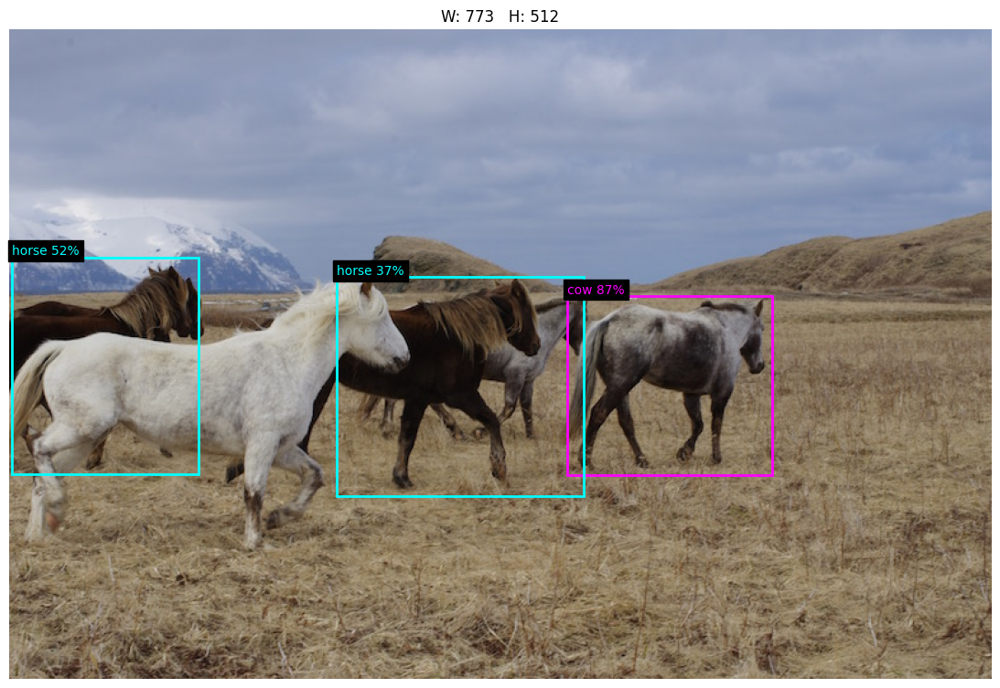

torch.Size([3, 729, 1296])


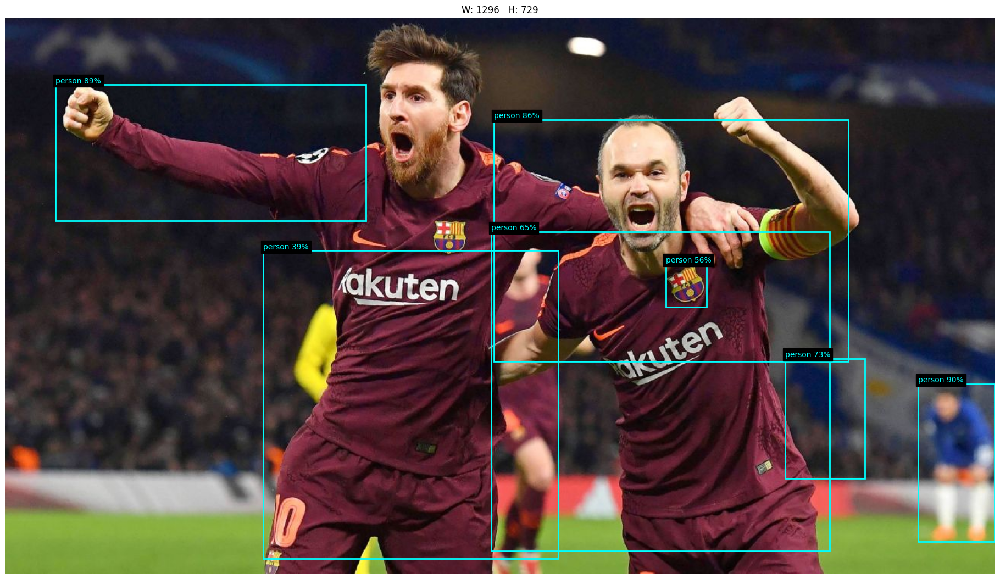

torch.Size([3, 1600, 1200])


KeyboardInterrupt: 

In [80]:
import os 
path = 'data/samples'
files = os.listdir('data\samples')
for file in files:
    img = Image.open(os.path.join(path, file)).convert("RGB")
    img = transforms.ToTensor()(img)
    print(img.shape)
    model.head.merge = False

    images = [img]*N
    results, losses = model(images)
    results = non_max_sup(results, N=N)
    yolo.show(images[0], results, classes, save="r000.jpg")

In [63]:
# below is to test COCO val2017 dataset

In [64]:
import os

use_cuda = False
dataset = "coco" # currently only support VOC and COCO datasets
file_root = "data/coco2017/val2017"
ann_file = "data/coco2017/annotations/instances_val2017.json"
output_dir = "yolov5s_val2017"

# create output directory
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
    
# choose device and show GPU information
device = torch.device("cuda" if torch.cuda.is_available() and use_cuda else "cpu")
cuda = device.type == "cuda"
if cuda: yolo.get_gpu_prop(show=True)
print("\ndevice: {}".format(device))

ds = yolo.datasets(dataset, file_root, ann_file, train=True)
dl = torch.utils.data.DataLoader(ds, shuffle=True, collate_fn=yolo.collate_wrapper, pin_memory=cuda)
# DataPrefetcher behaves like PyTorch's DataLoader, but it outputs CUDA tensors
d = yolo.DataPrefetcher(dl) if cuda else dl

model.to(device)

if ckpt_path:
    checkpoint = torch.load(ckpt_path, map_location=device)
    if "ema" in checkpoint:
        model.load_state_dict(checkpoint["ema"][0])
        print(checkpoint["eval_info"])
    else:
        model.load_state_dict(checkpoint)
    del checkpoint
    if cuda: torch.cuda.empty_cache()
    
for p in model.parameters():
    p.requires_grad_(False)


device: cpu
loading annotations into memory...
Done (t=0.54s)
creating index...
index created!
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.398
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.292
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.412
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.232
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.364
 Averag